In [ ]:
car_img_path="/content/car.jpeg"

In [ ]:
car_img_path

'/content/car.jpeg'

In [ ]:
!pip list

Package                          Version
-------------------------------- ---------------------
absl-py                          1.4.0
aiohttp                          3.8.5
aiosignal                        1.3.1
alabaster                        0.7.13
albumentations                   1.3.1
altair                           4.2.2
anyio                            3.7.1
appdirs                          1.4.4
argon2-cffi                      23.1.0
argon2-cffi-bindings             21.2.0
array-record                     0.4.1
arviz                            0.15.1
astropy                          5.3.2
astunparse                       1.6.3
async-timeout                    4.0.3
attrs                            23.1.0
audioread                        3.0.0
autograd                         1.6.2
Babel                            2.12.1
backcall                         0.2.0
beautifulsoup4                   4.11.2
bleach                           6.0.0
blinker                          1.4
bl

machine learing
pandas
numpy
scikit learn
seaborn/matplotlib

deep- learning
tensorflow
pytorch
keras

opencv
nltk
gensim
spacy

In [ ]:
car_img_path="/content/car.jpeg"

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2#opencv

In [ ]:
img=cv2.imread(car_img_path)

In [ ]:
img.shape

(168, 300, 3)

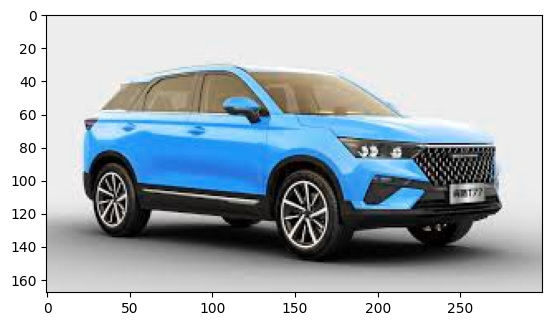

In [ ]:
plt.imshow(img)

In [ ]:
img2=cv2.cvtColor(img,cv2. COLOR_BGR2RGB)

In [ ]:
img2.shape

(168, 300, 3)

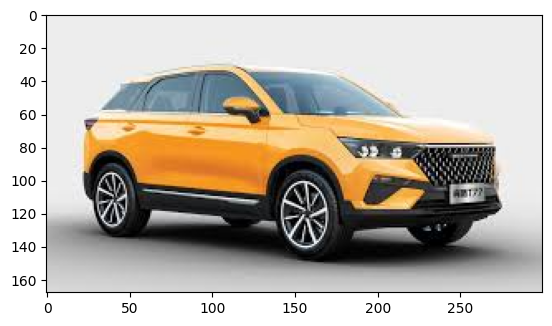

In [ ]:
plt.imshow(img2)

In [ ]:
img3=cv2.cvtColor(img,cv2. COLOR_BGR2GRAY)

In [ ]:
img3.shape

(168, 300)

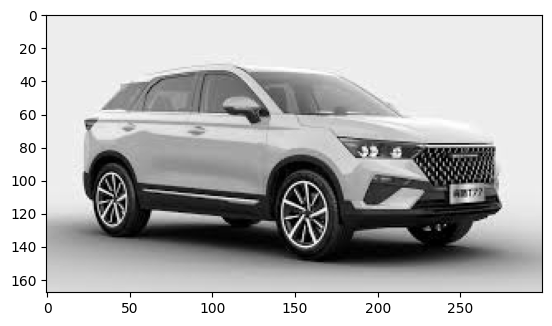

In [ ]:
plt.imshow(img3,cmap="gray")

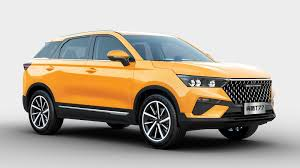

In [ ]:
from google.colab.patches import cv2_imshow
cv2_imshow(img)

In [ ]:
img3.shape

(168, 300)

In [ ]:
row,col=img3.shape

In [ ]:
car=img3.reshape(1,row,col,1)

In [ ]:
car.shape

(1, 168, 300, 1)

In [ ]:
Conv_layer=[tf.keras.layers.Conv2D(
    filters=1,
    kernel_size=(3,3),
    strides=(1,1),
    input_shape=car.shape[1:]
)]

In [ ]:
conv_model=tf.keras.Sequential(Conv_layer)

In [ ]:
conv_model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 166, 298, 1)       10        
                                                                 
Total params: 10 (40.00 Byte)
Trainable params: 10 (40.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
output=conv_model.predict(car)

1/1 [==============================] - 0s 21ms/step


In [ ]:
output.shape

(1, 166, 298, 1)

In [ ]:
((168+0-3)//1)+1

166

In [ ]:
row,col=output.shape[1:-1]

In [ ]:
reshaped_output=output.reshape(row,col)

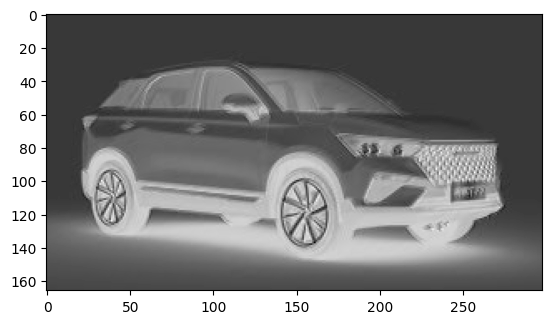

In [ ]:
plt.imshow(reshaped_output,cmap="gray")

In [ ]:
row,col,depth=img2.shape

In [ ]:
color_car=img2

In [ ]:
reshaped_color_img=color_car.reshape(1,row,col,depth)

In [ ]:
reshaped_color_img.shape

(1, 168, 300, 3)

In [ ]:
reshaped_color_img.shape[1:]

(168, 300, 3)

In [ ]:
CONV_LAYER=[tf.keras.layers.Conv2D(
    filters=1,
    kernel_size=(3,3),
    strides=(1,1),
    input_shape=reshaped_color_img.shape[1:]
)]

In [ ]:
conv_model=tf.keras.Sequential(CONV_LAYER)

In [ ]:
conv_model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 166, 298, 1)       28        
                                                                 
Total params: 28 (112.00 Byte)
Trainable params: 28 (112.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
color_output=conv_model.predict(reshaped_color_img)

1/1 [==============================] - 0s 29ms/step


In [ ]:
color_output.shape

(1, 166, 298, 1)

In [ ]:
row,col=color_output.shape[1:-1]

In [ ]:
reshaped_out=color_output.reshape(row,col)

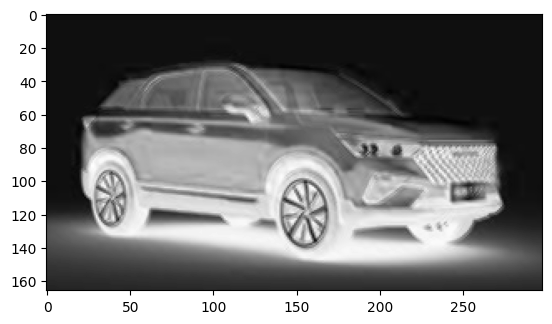

In [ ]:
plt.imshow(reshaped_out,cmap="gray")

In [ ]:
color_car.shape

(168, 300, 3)

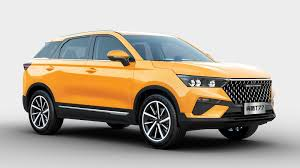

In [ ]:
from google.colab.patches import cv2_imshow
cv2_imshow(img)

In [ ]:
def reshaping_in(img, grayscale=True):
  if grayscale:
    row,col = img.shape
    img = img.reshape(1,row,col,1) # grayscale
    return img
  row,col,depth = img.shape
  color_img = img.reshape(1,row,col,depth) # colored
  return color_img

In [ ]:
def max_pooling(img, pool_size=(2,2), strides=(2,2)):
  reshaped_img = reshaping_in(img,grayscale=False)
  pooling_layer = tf.keras.layers.MaxPool2D(pool_size=pool_size, strides=strides)
  result = pooling_layer(reshaped_img)
  return result

In [ ]:
result=max_pooling(color_car)

In [ ]:
result

<tf.Tensor: shape=(1, 84, 150, 3), dtype=uint8, numpy=
array([[[[237, 237, 237],
         [237, 237, 237],
         [237, 237, 237],
         ...,
         [237, 237, 237],
         [237, 237, 237],
         [237, 237, 237]],

        [[237, 237, 237],
         [237, 237, 237],
         [237, 237, 237],
         ...,
         [237, 237, 237],
         [237, 237, 237],
         [237, 237, 237]],

        [[237, 237, 237],
         [237, 237, 237],
         [237, 237, 237],
         ...,
         [237, 237, 237],
         [237, 237, 237],
         [237, 237, 237]],

        ...,

        [[213, 213, 213],
         [213, 213, 213],
         [213, 213, 213],
         ...,
         [207, 207, 207],
         [207, 207, 207],
         [207, 207, 207]],

        [[216, 216, 216],
         [216, 216, 216],
         [216, 216, 216],
         ...,
         [211, 211, 211],
         [211, 211, 211],
         [211, 211, 211]],

        [[217, 217, 217],
         [217, 217, 217],
         [217, 217,

In [ ]:
#tensor
result.shape

TensorShape([1, 84, 150, 3])

In [ ]:
def plot(result):
  _,row,col,_=result.shape
  reshaped_img=tf.reshape(result,(row,col,3))
  plt.imshow(reshaped_img)

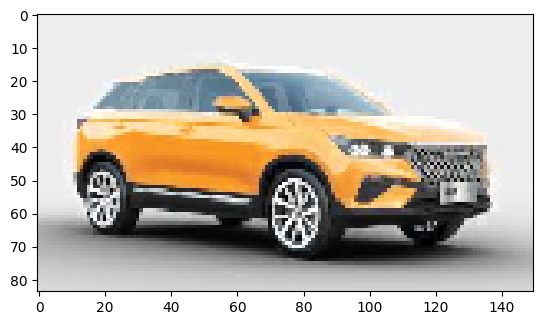

In [ ]:
plot(result)

In [ ]:
min,avg,globalpooling

In [ ]:
def reshaping_in(img, grayscale=True):
  if grayscale:
    row,col = img.shape
    img = img.reshape(1,row,col,1) # grayscale
    return img
  row,col,depth = img.shape
  color_img = img.reshape(1,row,col,depth) # colored
  return color_img

In [ ]:
def get_conv_model(filters=1, filter_size=(3,3), strides=(1,1), input_shape=None, padding="valid"):
  CONV_LAYER = [tf.keras.layers.Conv2D(filters=filters,
                                      kernel_size=filter_size,
                                      strides=(1,1),
                                      input_shape=input_shape,
                                      padding=padding)]

  conv_model = tf.keras.Sequential(CONV_LAYER)
  conv_model.summary()
  return conv_model


In [ ]:
def apply_conv_model_and_visualize(img, conv_model):
  try:
    out = conv_model.predict(img)
    print(out.shape)
    row, col, depth = out.shape[1:]
    reshape_out = out.reshape(row, col, depth)

    for d in range(depth):
      plt.imshow(reshape_out[:,:,d], cmap="gray")
      plt.show()

  except Exception as e:
    raise e

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_7 (Conv2D)           (None, 166, 298, 10)      280       
                                                                 
Total params: 280 (1.09 KB)
Trainable params: 280 (1.09 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
1/1 [==============================] - 0s 167ms/step
(1, 166, 298, 10)


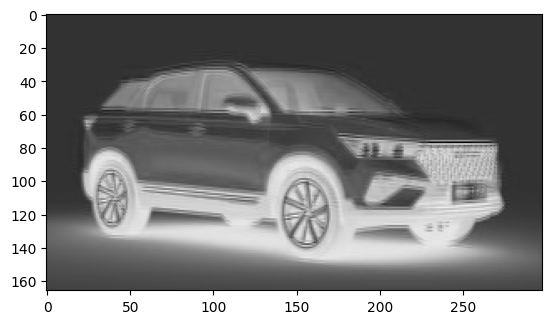

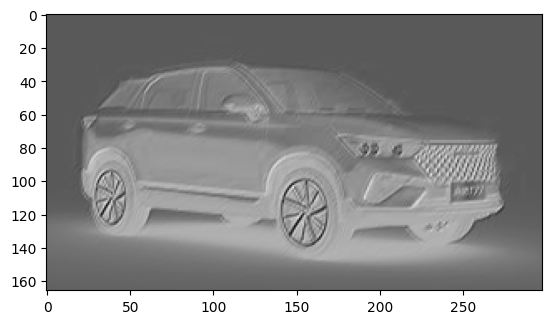

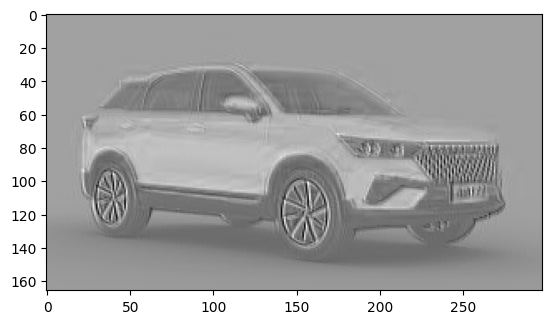

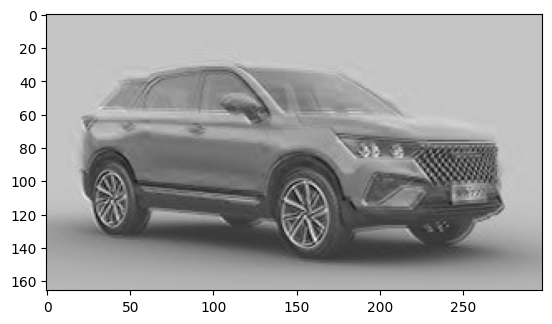

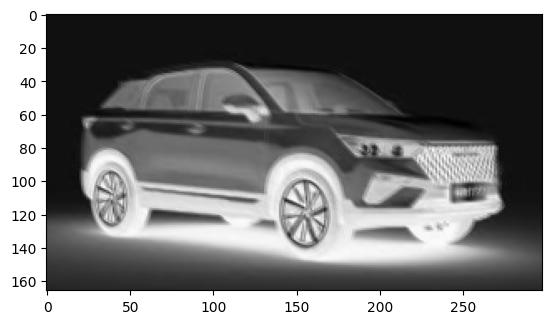

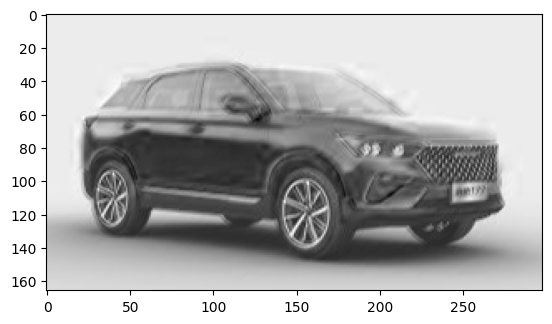

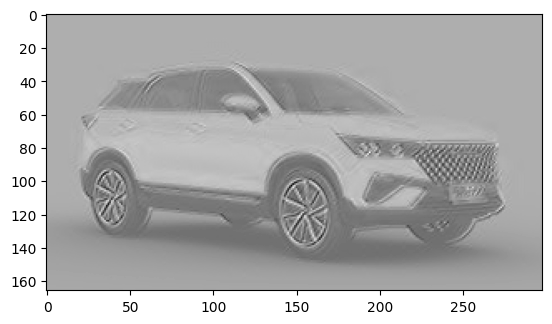

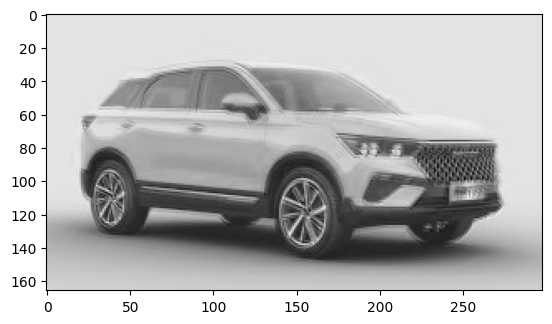

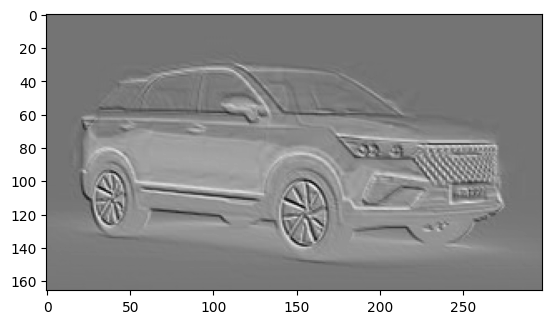

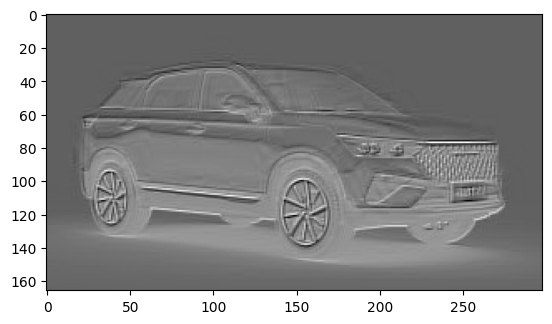

In [ ]:
input_img=reshaping_in(color_car,grayscale=False)
model=get_conv_model(filters=10,filter_size=(3,3),strides=(1,1),input_shape=input_img.shape[1:])
apply_conv_model_and_visualize(input_img,model)

In [ ]:
!mkdir -p ~/ .kaggle

In [ ]:
!cp kaggle.json ~/.kaggle/

In [ ]:
!chmod 600 /root/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d salader/dogs-vs-cats

 99% 1.05G/1.06G [00:11<00:00, 270MB/s]
100% 1.06G/1.06G [00:11<00:00, 98.3MB/s]


In [ ]:
try:
  import evidently
  print("sucessfully imported")

except Exception as e:
  print(e)

sucessfully imported


In [ ]:
 !pip install git+https://github.com/evidentlyai/evidently.git

  Cloning https://github.com/evidentlyai/evidently.git to /tmp/pip-req-build-roizx6ea
  Running command git clone --filter=blob:none --quiet https://github.com/evidentlyai/evidently.git /tmp/pip-req-build-roizx6ea
  Resolved https://github.com/evidentlyai/evidently.git to commit 94fa96198f13a4bf13871e557dbb5ceab4da5123
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.2/66.2 kB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.5/59.5 kB 581.2 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.1/82.1 kB 11.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.0/40.0 MB 11.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.0/67.0 kB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 41.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 6.1 MB/s eta 0:00:00
  Created wheel for evidently: filename=evidently-0.4.4-py3-none-any.whl siz

In [ ]:
import pandas as pd
import numpy as np
import requests
import zipfile
import io

from datetime import datetime, time
from sklearn import datasets, ensemble

from evidently import ColumnMapping
from evidently.report import Report
from evidently.metric_preset import DataDriftPreset, TargetDriftPreset, RegressionPreset

In [ ]:
content = requests.get("https://archive.ics.uci.edu/static/public/275/bike+sharing+dataset.zip").content
with zipfile.ZipFile(io.BytesIO(content)) as arc:
    raw_data = pd.read_csv(arc.open("hour.csv"), header=0, sep=',', parse_dates=['dteday'], index_col='dteday')

In [ ]:
raw_data

,instant,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
dteday,,,,,,,,,,,,,,,,
2011-01-01,1,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0000,3,13,16
2011-01-01,2,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0000,8,32,40
2011-01-01,3,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0000,5,27,32
2011-01-01,4,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0000,3,10,13
2011-01-01,5,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0000,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012-12-31,17375,1,1,12,19,0,1,1,2,0.26,0.2576,0.60,0.1642,11,108,119
2012-12-31,17376,1,1,12,20,0,1,1,2,0.26,0.2576,0.60,0.1642,8,81,89
2012-12-31,17377,1,1,12,21,0,1,1,1,0.26,0.2576,0.60,0.1642,7,83,90


In [ ]:
raw_data.index = raw_data.apply(
    lambda row: datetime.combine(row.name, time(hour=int(row['hr']))), axis = 1)

In [ ]:
raw_data.head()

,instant,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
2011-01-01 00:00:00,1,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
2011-01-01 01:00:00,2,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2011-01-01 02:00:00,3,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
2011-01-01 03:00:00,4,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
2011-01-01 04:00:00,5,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


In [ ]:
target = 'cnt'
prediction = 'prediction'
numerical_features = ['temp', 'atemp', 'hum', 'windspeed', 'hr', 'weekday']
categorical_features = ['season', 'holiday', 'workingday']

In [ ]:
reference = raw_data.loc['2011-01-01 00:00:00':'2011-01-28 23:00:00']
current = raw_data.loc['2011-01-29 00:00:00':'2011-02-28 23:00:00']

In [ ]:
reference.head()

,instant,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
2011-01-01 00:00:00,1,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
2011-01-01 01:00:00,2,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2011-01-01 02:00:00,3,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
2011-01-01 03:00:00,4,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
2011-01-01 04:00:00,5,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


In [ ]:
regressor = ensemble.RandomForestRegressor(random_state = 0, n_estimators = 50)

In [ ]:
regressor.fit(reference[numerical_features + categorical_features], reference[target])

RandomForestRegressor(n_estimators=50, random_state=0)

In [ ]:
ref_prediction = regressor.predict(reference[numerical_features + categorical_features])
current_prediction = regressor.predict(current[numerical_features + categorical_features])

In [ ]:
reference['prediction'] = ref_prediction
current['prediction'] = current_prediction

In [ ]:
column_mapping = ColumnMapping()

column_mapping.target = target
column_mapping.prediction = prediction
column_mapping.numerical_features = numerical_features
column_mapping.categorical_features = categorical_features

In [ ]:
regression_perfomance = Report(metrics=[RegressionPreset()])
regression_perfomance.run(current_data=reference, reference_data=None, column_mapping=column_mapping)

In [ ]:
regression_perfomance.show()

In [ ]:
regression_perfomance = Report(metrics=[RegressionPreset()])
regression_perfomance.run(current_data=current.loc['2011-01-29 00:00:00':'2011-02-07 23:00:00'],
                          reference_data=reference,
                          column_mapping=column_mapping)

regression_perfomance.show()

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:918: UndefinedMetricWarning:

R^2 score is not well-defined with less than two samples.



In [ ]:
target_drift = Report(metrics=[TargetDriftPreset()])
target_drift.run(current_data=current.loc['2011-01-29 00:00:00':'2011-02-07 23:00:00'],
                 reference_data=reference,
                 column_mapping=column_mapping)

target_drift.show()